In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_filtered_images.npy')
masks = np.load('/hpcstor6/scratch01/r/ryan.zurrin001/EBHI-SEG/EBHI_filtered_masks.npy')

In [3]:
X_test = images[1700:2141]
y_test = masks[1700:2141]

In [4]:
images = images[0:1700]
masks = masks[0:1700]

In [5]:
barebone_model = '/tmp/tmp7h8stef3kuc_unet2d/kuc_unet2d_0kuc_unet2d_model'

In [6]:
images.shape

(1700, 512, 512, 1)

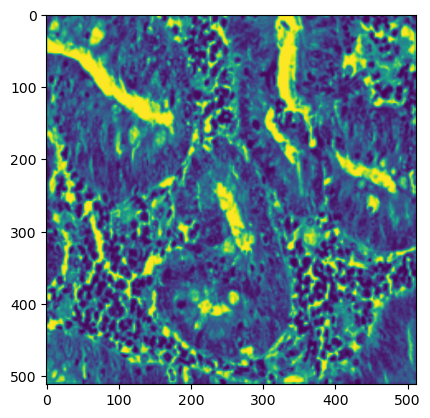

In [7]:
imshow(images[100])

In [8]:
masks.shape

(1700, 512, 512, 1)

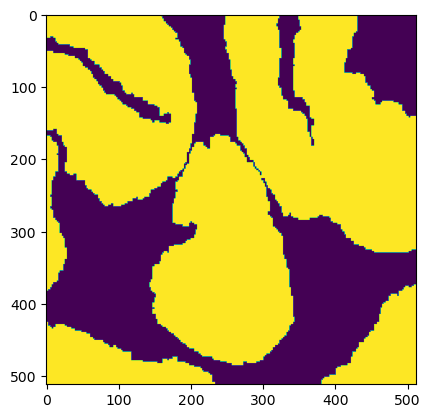

In [9]:
imshow(masks[100])

In [10]:
import sys
sys.path.append('../')
import gp2

In [11]:
from keras import losses

In [12]:
loss_fx = losses.BCE

In [13]:
C = gp2.KUC_UNet2D(loss=loss_fx, model_path=barebone_model)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmpqx53r02kkuc_unet2d


In [14]:
from runner import Runner
R = Runner(verbose=True, workingdir=C.workingdir)

*** GP2 ***
Working directory: /tmp/tmpqx53r02kkuc_unet2d
Verbose mode active!


In [15]:
R.classifier = C ### use custom classifier

In [16]:
R.run(images, masks, runs=10, batch_size=16, shuffle=True, results_file='/raid/mpsych/OMAMA/GP2/results/kuc_unet2d_0kuc_unet2d_model_1_10_EBHI_filtered.pkl')

Shuffling data...
Weights OK!
******
Loop 1
Epoch 1/100
6/6 [==============================] - 24s 2s/step - loss: 0.3471 - dice_coeff: 0.8367 - val_loss: 0.2798 - val_dice_coeff: 0.8723
Epoch 2/100
6/6 [==============================] - 3s 482ms/step - loss: 0.3247 - dice_coeff: 0.8610 - val_loss: 0.3549 - val_dice_coeff: 0.8708
Epoch 3/100
6/6 [==============================] - 3s 481ms/step - loss: 0.3546 - dice_coeff: 0.8395 - val_loss: 0.2825 - val_dice_coeff: 0.8535
Epoch 4/100
6/6 [==============================] - 3s 473ms/step - loss: 0.3475 - dice_coeff: 0.8445 - val_loss: 0.3040 - val_dice_coeff: 0.8348
Model saved to: /tmp/tmpqx53r02kkuc_unet2d/kuc_unet2d_0kuc_unet2d_model
History saved to: /tmp/tmpqx53r02kkuc_unet2d/kuc_unet2d_history_0.pkl
Testing the classifier...
Model saved to /tmp/tmpqx53r02kkuc_unet2d/cnnd_0.model
History saved to /tmp/tmpqx53r02kkuc_unet2d/cnnd_history_0.pickle
Testing the discriminator...
4/4 [==============================] - 0s 26ms/step - loss: 

Testing the classifier...
Testing the discriminator...
4/4 [==============================] - 0s 43ms/step - loss: 0.0000e+00 - accuracy: 1.0000
Found 58 machine labels.
Replacing 19 from 58 !
D_relabeled_ 19
point ids 19
Removed: 19 Filled: 19
TOOK 56.18443989753723 seconds
==== DONE LOOP 7 ====
******
Loop 8
Epoch 1/100
13/13 [==============================] - 10s 831ms/step - loss: 0.2672 - dice_coeff: 0.8778 - val_loss: 0.2736 - val_dice_coeff: 0.8790
Epoch 2/100
13/13 [==============================] - 5s 354ms/step - loss: 0.2673 - dice_coeff: 0.8867 - val_loss: 0.2773 - val_dice_coeff: 0.8628
Epoch 3/100
13/13 [==============================] - 4s 352ms/step - loss: 0.2672 - dice_coeff: 0.8828 - val_loss: 0.2710 - val_dice_coeff: 0.8729
Model saved to: /tmp/tmpqx53r02kkuc_unet2d/kuc_unet2d_7kuc_unet2d_model
History saved to: /tmp/tmpqx53r02kkuc_unet2d/kuc_unet2d_history_7.pkl
Testing the classifier...
Testing the discriminator...
4/4 [==============================] - 0s 28ms/st

In [17]:
R.classifier_scores

[[0.31012555956840515, 0.8361185193061829],
 [0.28516459465026855, 0.8706280589103699],
 [0.2830656170845032, 0.8766777515411377],
 [0.2825819253921509, 0.8752774596214294],
 [0.3006552755832672, 0.8756409883499146],
 [0.28864219784736633, 0.8703329563140869],
 [0.28105446696281433, 0.8719232678413391],
 [0.28459277749061584, 0.8705505728721619],
 [0.29437005519866943, 0.8745522499084473],
 [0.2982214391231537, 0.8763206005096436]]

In [18]:
R.discriminator_scores

[[0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0],
 [0.0, 1.0]]

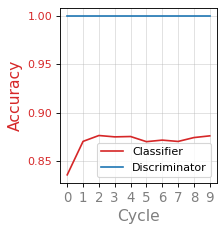

In [19]:
R.plot()

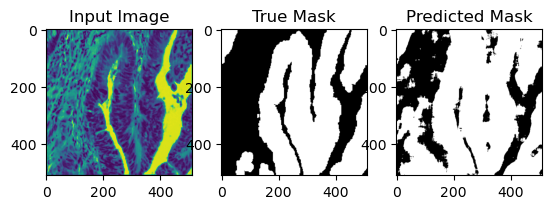

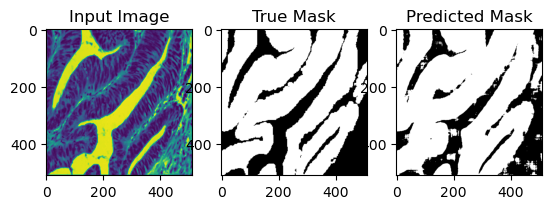

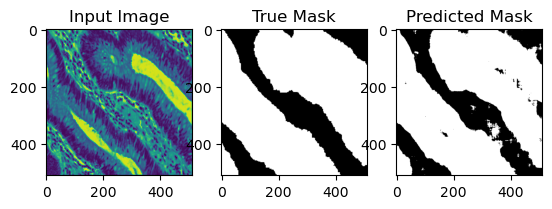

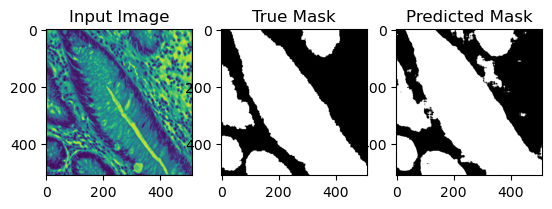

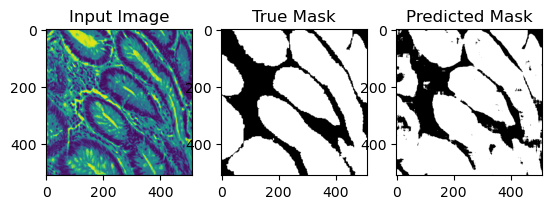

...

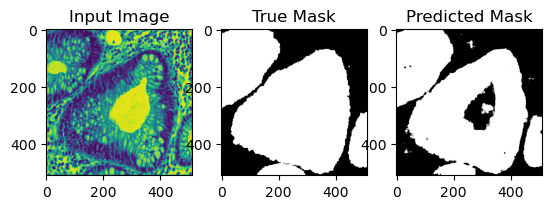

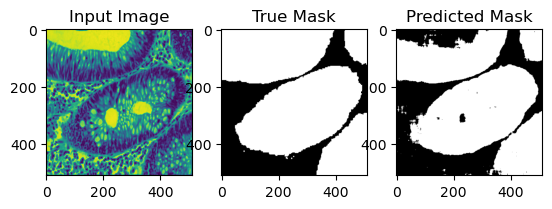

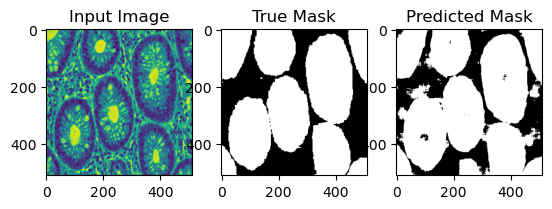

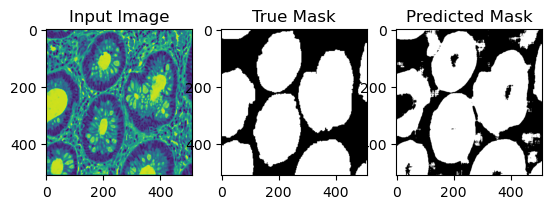

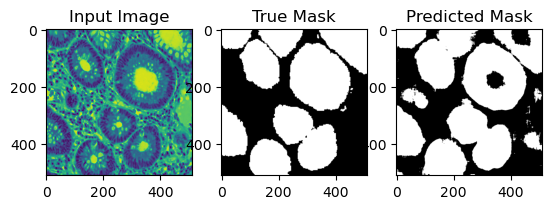

In [20]:
gp2.Util.visualize_predictions(C, X_test, y_test, num_samples=100)

In [21]:
y_pred = R.classifier.predict(X_test, y_test)

In [22]:
y_pred

(array([[[[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         ...,
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [1.],
          [1.],
          [1.]]],
 
 
        [[[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
      

In [23]:
BareBone = gp2.KUC_UNet2D(loss=loss_fx, model_path=barebone_model)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmpqx53r02kkuc_unet2d


In [24]:
barebone_pred = BareBone.predict(X_test, y_test)

In [25]:
barebone_pred

(array([[[[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [1.],
          [1.],
          [1.]],
 
         ...,
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[0.],
          [0.],
          [0.],
          ...,
          [0.],
          [0.],
          [0.]]],
 
 
        [[[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
          [0.],
          [0.],
          [0.]],
 
         [[1.],
          [1.],
          [1.],
          ...,
      

In [26]:
BareBone.model.metrics_names

['loss', 'dice_coeff']